# **Semantic Segmentation using Segformer**


Semantic segmentation is a deep learning algorithm that associates a label or category with every pixel in an image. It is used to recognize a collection of pixels that form distinct categories. For example, an autonomous vehicle needs to identify vehicles, pedestrians, traffic signs, pavement, and other road features.

A simple example of semantic segmentation is separating the images into two classes. For example an image showing a person at the beach is paired with a version showing the image's pixels segmented into two separate classes: person and background.

**Image and labeled pixels**

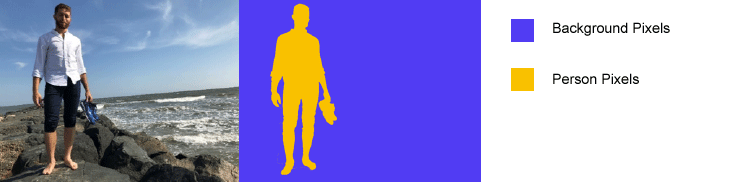




## How Is Semantic Segmentation Used


* Autonomous driving—for identifying a drivable path for cars by separating the road from obstacles like pedestrians, sidewalks, poles, and other cars
* Industrial inspection—for detecting defects in materials, such as wafer inspection
* Satellite imagery—for identifying mountains, rivers, deserts, and other terrain
* Medical imaging—for analyzing and detecting cancerous anomalies in cells
* Robotic vision—for identifying and navigating objects and terrain


## How Semantic Segmentation Works



The process of training a semantic segmentation network to classify images follows these steps:

1. Analyze a collection of pixel-labeled images.
2. Create a semantic segmentation network.
3. Train the network to classify images into pixel categories.
4. Assess the accuracy of the network.

# SegFormer

SegFormer, a simple, efficient yet powerful semantic segmentation framework which unifies Transformers with lightweight multilayer perceptron (MLP) decoders.

SegFormer has two appealing features:
1.  SegFormer comprises a novel hierarchically structured Transformer encoder which outputs multiscale features. It does not need positional encoding.
2.  SegFormer avoids complex decoders.

SegFormer-B4 achieves 50.3% mIoU on ADE20K with 64M parameters, being 5× smaller and 2.2% better than the previous best method. Our best model, SegFormer-B5, achieves 84.0% mIoU on Cityscapes validation set and shows excellent zero-shot robustness on Cityscapes-C.

Code: [github.com/NVlabs/SegFormer](https://github.com/NVlabs/SegFormer)

Paper: [SegFormer: Simple and Efficient Design for Semantic Segmentation with Transformers](https://arxiv.org/pdf/2105.15203.pdf)


#Practical: Fine-Tune a Semantic Segmentation Model with a Custom Dataset using SegFormer

In this scenario we will be building a model for an autonomous delivery robot, so it can see where to drive and recognize obstacles.

Install the necessary dependencies and login to Hugging Face.

In [ ]:
! pip install -q transformers datasets segments-ai evaluate
! pip install accelerate -U
! pip install -U transformers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 521.2/521.2 kB 6.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 kB 6.3 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.1/84.1 kB 6.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.3/115.3 kB 7.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 9.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 381.9/381.9 kB 12.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 51.5/51.5 kB 7.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 20.7 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
lida 0.0.10 requires fastapi, which is not

In [ ]:
from huggingface_hub import notebook_login

notebook_login()

In [ ]:
# Insert your Hugging Face username

hf_username = "INSERT YOUR USERNAME"

# 1. Create/choose a dataset

The first step in any ML project is assembling a good dataset. In order to train a semantic segmentation model, we need a dataset with semantic segmentation labels. We can either use an existing dataset from the Hugging Face Hub, such as [ADE20k](https://huggingface.co/datasets/scene_parse_150), or create our own dataset.

For our delivery robot, we could use an existing autonomous driving dataset such as [CityScapes](https://www.cityscapes-dataset.com/) or [BDD100K](https://bdd100k.com/). However, these datasets were captured by cars driving on the road. Since our delivery robot will be driving on the sidewalk, there will be a mismatch between the images in these datasets and the data our robot will see in the real world.

We don't want our delivery robot to get confused, so we'll create our own semantic segmentation dataset using images captured on sidewalks. In the next steps, we'll show how you can label the images we captured. If you just want to use our finished labeled dataset, you can skip the "Create your own dataset" section and continue from "Use a dataset from the Hub".

## Create your own dataset


To create your own semantic segmentation dataset, we need two things:
1. images covering the situations your model will encounter in the real world,
2. segmentation labels, i.e. images where each pixel represents a class/category.

We went ahead and captured a thousand images of sidewalks in Belgium. Collecting and labeling such a dataset can take a long time, so you can also start with a smaller dataset, and expand it if the model does not perform well enough.

![Sidewalk examples](https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/blog/56_fine_tune_segformer/sidewalk-examples.png)

To obtain segmentation labels, we need to indicate the classes of all the regions/objects in these images. This can be a time-consuming endeavour, but using the right tools can speed up the task significantly. For labeling, we'll use [Segments.ai](https://segments.ai?utm_source=hf&utm_medium=colab&utm_campaign=sem_seg), since it has smart labeling tools for image segmentation, and an easy-to-use Python SDK.

### Set up the labeling task on Segments.ai

First, create an account at [https://segments.ai/join](https://segments.ai/join?utm_source=hf&utm_medium=colab&utm_campaign=sem_seg). Next, you can create a dataset by using the web interface, or via the Python SDK. Here, we'll show how you can create a dataset programmatically.

We'll start by initializing the Segments.ai client using an API key. This key can be found on [the account page](https://segments.ai/account).

In [ ]:
from segments import SegmentsClient
from getpass import getpass

api_key = getpass('Enter your API key: ')
segments_client = SegmentsClient(api_key)

Next, we'll create a new dataset by choosing a name and by listing the different categories we want to label.

In [ ]:
dataset_name = "sidewalk-imagery"

The next cell contains the `task_attributes` with the categories we want to label. The format for `task_attributes` is defined in the [docs](https://docs.segments.ai/reference/categories-and-task-attributes).

In [ ]:
#@title `task_attributes = {...}`

task_attributes = {
 "format_version": "0.1",
 "categories": [
  {
   "name": "flat-road",
   "id": 1,
   "color": [
    216,
    82,
    24,
    255
   ],
   "attributes": []
  },
  {
   "name": "flat-sidewalk",
   "id": 2,
   "color": [
    255,
    255,
    0
   ],
   "attributes": []
  },
  {
   "name": "flat-crosswalk",
   "id": 3,
   "color": [
    125,
    46,
    141,
    255
   ],
   "attributes": []
  },
  {
   "name": "flat-cyclinglane",
   "id": 4,
   "color": [
    118,
    171,
    47,
    255
   ],
   "attributes": []
  },
  {
   "name": "flat-parkingdriveway",
   "id": 5,
   "color": [
    161,
    19,
    46,
    255
   ],
   "attributes": []
  },
  {
   "name": "flat-railtrack",
   "id": 6,
   "color": [
    255,
    0,
    0,
    255
   ],
   "attributes": []
  },
  {
   "name": "flat-curb",
   "id": 7,
   "color": [
    0,
    128,
    128
   ],
   "attributes": []
  },
  {
   "name": "human-person",
   "id": 8,
   "attributes": [
    {
     "name": "is_crowd",
     "input_type": "checkbox",
     "default_value": False
    }
   ],
   "color": [
    190,
    190,
    0,
    255
   ]
  },
  {
   "name": "human-rider",
   "id": 9,
   "attributes": [
    {
     "name": "is_crowd",
     "input_type": "checkbox",
     "default_value": False
    }
   ],
   "color": [
    0,
    255,
    0,
    255
   ]
  },
  {
   "name": "vehicle-car",
   "id": 10,
   "attributes": [
    {
     "name": "is_crowd",
     "input_type": "checkbox",
     "default_value": False
    }
   ],
   "color": [
    0,
    0,
    255,
    255
   ]
  },
  {
   "name": "vehicle-truck",
   "id": 11,
   "attributes": [
    {
     "name": "is_crowd",
     "input_type": "checkbox",
     "default_value": False
    }
   ],
   "color": [
    170,
    0,
    255,
    255
   ]
  },
  {
   "name": "vehicle-bus",
   "id": 12,
   "attributes": [
    {
     "name": "is_crowd",
     "input_type": "checkbox",
     "default_value": False
    }
   ],
   "color": [
    84,
    84,
    0,
    255
   ]
  },
  {
   "name": "vehicle-tramtrain",
   "id": 13,
   "attributes": [
    {
     "name": "is_crowd",
     "input_type": "checkbox",
     "default_value": False
    }
   ],
   "color": [
    84,
    170,
    0,
    255
   ]
  },
  {
   "name": "vehicle-motorcycle",
   "id": 14,
   "attributes": [
    {
     "name": "is_crowd",
     "input_type": "checkbox",
     "default_value": False
    }
   ],
   "color": [
    84,
    255,
    0,
    255
   ]
  },
  {
   "name": "vehicle-bicycle",
   "id": 15,
   "attributes": [
    {
     "name": "is_crowd",
     "input_type": "checkbox",
     "default_value": False
    }
   ],
   "color": [
    170,
    84,
    0,
    255
   ]
  },
  {
   "name": "vehicle-caravan",
   "id": 16,
   "attributes": [
    {
     "name": "is_crowd",
     "input_type": "checkbox",
     "default_value": False
    }
   ],
   "color": [
    170,
    170,
    0,
    255
   ]
  },
  {
   "name": "vehicle-cartrailer",
   "id": 17,
   "attributes": [
    {
     "name": "is_crowd",
     "input_type": "checkbox",
     "default_value": False
    }
   ],
   "color": [
    170,
    255,
    0,
    255
   ]
  },
  {
   "name": "construction-building",
   "id": 18,
   "color": [
    255,
    84,
    0,
    255
   ],
   "attributes": []
  },
  {
   "name": "construction-door",
   "id": 19,
   "color": [
    255,
    170,
    0,
    255
   ],
   "attributes": []
  },
  {
   "name": "construction-wall",
   "id": 20,
   "color": [
    255,
    255,
    0,
    255
   ],
   "attributes": []
  },
  {
   "name": "construction-fenceguardrail",
   "id": 21,
   "color": [
    33,
    138,
    200
   ],
   "attributes": []
  },
  {
   "name": "construction-bridge",
   "id": 22,
   "color": [
    0,
    170,
    127,
    255
   ],
   "attributes": []
  },
  {
   "name": "construction-tunnel",
   "id": 23,
   "color": [
    0,
    255,
    127,
    255
   ],
   "attributes": []
  },
  {
   "name": "construction-stairs",
   "id": 24,
   "color": [
    84,
    0,
    127,
    255
   ],
   "attributes": []
  },
  {
   "name": "object-pole",
   "id": 25,
   "attributes": [
    {
     "name": "is_crowd",
     "input_type": "checkbox",
     "default_value": False
    }
   ],
   "color": [
    84,
    84,
    127,
    255
   ]
  },
  {
   "name": "object-trafficsign",
   "id": 26,
   "color": [
    84,
    170,
    127,
    255
   ],
   "attributes": []
  },
  {
   "name": "object-trafficlight",
   "id": 27,
   "color": [
    84,
    255,
    127,
    255
   ],
   "attributes": []
  },
  {
   "name": "nature-vegetation",
   "id": 28,
   "color": [
    170,
    0,
    127,
    255
   ],
   "attributes": []
  },
  {
   "name": "nature-terrain",
   "id": 29,
   "color": [
    170,
    84,
    127,
    255
   ],
   "attributes": []
  },
  {
   "name": "sky",
   "id": 30,
   "color": [
    170,
    170,
    127,
    255
   ],
   "attributes": []
  },
  {
   "name": "void-ground",
   "id": 31,
   "color": [
    170,
    255,
    127,
    255
   ],
   "attributes": []
  },
  {
   "name": "void-dynamic",
   "id": 32,
   "color": [
    255,
    0,
    127,
    255
   ],
   "attributes": []
  },
  {
   "name": "void-static",
   "id": 33,
   "color": [
    255,
    84,
    127,
    255
   ],
   "attributes": []
  },
  {
   "name": "void-unclear",
   "id": 34,
   "color": [
    255,
    170,
    127,
    255
   ],
   "attributes": []
  }
 ]
}

In [ ]:
dataset_response = segments_client.add_dataset(dataset_name, task_attributes=task_attributes, category='street_scenery')
dataset_identifier = f'{dataset_response.owner.username}/{dataset_name}'

Now we can add images to the dataset. As an example, we'll add 10 examples images from the sidewalk dataset using `segments_client.add_sample()`.

In [ ]:
#@title `sample_attributes = [...]`

sample_attributes = [
    {
        "image": {
            "url": "https://segmentsai-prod.s3.eu-west-2.amazonaws.com/assets/tobias/72939ba9-8488-4dfe-81a2-1a299f2e1d95.jpg"
        }
    },
    {
        "image": {
            "url": "https://segmentsai-prod.s3.eu-west-2.amazonaws.com/assets/tobias/6ef02d5d-e7e4-40f6-b65a-47dee4815e7a.jpg"
        }
    },
    {
        "image": {
            "url": "https://segmentsai-prod.s3.eu-west-2.amazonaws.com/assets/tobias/46216c90-7af9-4e06-af28-4a0734a1e3a2.jpg"
        }
    },
    {
        "image": {
            "url": "https://segmentsai-prod.s3.eu-west-2.amazonaws.com/assets/tobias/545a233e-4413-4b35-9e89-659be3550ddf.jpg"
        }
    },
    {
        "image": {
            "url": "https://segmentsai-prod.s3.eu-west-2.amazonaws.com/assets/tobias/3c0ef45e-6be6-48f3-b3cd-eb283ca3cb34.jpg"
        }
    },
    {
        "image": {
            "url": "https://segmentsai-prod.s3.eu-west-2.amazonaws.com/assets/tobias/8683e29d-3112-4dff-9a64-c699bc6e1457.jpg"
        }
    },
    {
        "image": {
            "url": "https://segmentsai-prod.s3.eu-west-2.amazonaws.com/assets/tobias/83ffe351-68ea-4730-b49c-4e6945ab5c18.jpg"
        }
    },
    {
        "image": {
            "url": "https://segmentsai-prod.s3.eu-west-2.amazonaws.com/assets/tobias/653e6961-d2fa-4c1f-b450-9615707372ed.jpg"
        }
    },
    {
        "image": {
            "url": "https://segmentsai-prod.s3.eu-west-2.amazonaws.com/assets/tobias/5ee54f18-f528-40dd-83a6-92ac4771fe75.jpg"
        }
    },
    {
        "image": {
            "url": "https://segmentsai-prod.s3.eu-west-2.amazonaws.com/assets/tobias/54b0f15a-271e-4b0c-962f-23bbf179c554.jpg"
        }
    },
]

In [ ]:
for attributes in sample_attributes:
  name = attributes['image']['url'].split('/')[-1]
  segments_client.add_sample(dataset_identifier, name, attributes)

If you don't have URLs for the images you want to upload, you can use `segments_client.upload_asset()` first, see [this example](https://docs.segments.ai/reference/python-sdk#upload-a-file-as-an-asset).

Alternatively, you can also drag and drop your files to the Samples tab of your dataset.

### Label the images

Now that the raw data is loaded, go to [segments.ai/home](https://segments.ai/home) and open the newly created dataset. Click "Start labeling" and create segmentation masks. You can use the ML-powered superpixel and autosegment tools to label faster.

![Labeling](https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/blog/56_fine_tune_segformer/sidewalk-labeling-crop.gif)

*Tip: when using the superpixel tool, scroll to change the superpixel size, and click and drag to select segments.*

### Push the result to the Hugging Face Hub

When you're done labeling, create a new dataset release containing the labeled data. You can either do this on the releases tab on Segments.ai, or programmatically through the SDK as shown below.

Note that creating the release can take a few seconds. You can check the releases tab on Segments.ai to check if your release is still being created.

In [ ]:
release_name = "v0.1"

segments_client.add_release(dataset_identifier, release_name)

Now, we'll use the `release2dataset` function to convert our release to a [Hugging Face dataset](https://huggingface.co/docs/datasets/package_reference/main_classes.html#datasets.Dataset). This can take a while, depending on the size of your dataset.

In [ ]:
from segments.huggingface import release2dataset

release = segments_client.get_release(dataset_identifier, release_name)
hf_dataset = release2dataset(release)

In [ ]:
hf_dataset.features

If we inspect the features of the new dataset, we can see the image column and the corresponding label. The label consists of two parts: a list of annotations and a segmentation bitmap. The annotation corresponds to the different objects in the image. For each object, the annotation contains an `id` and a `category_id`. The segmentation bitmap is an image where each pixel contains the `id` of the object at that pixel. More information can be found in the [relevant docs](https://docs.segments.ai/reference/sample-and-label-types/label-types#segmentation-labels).

For semantic segmentation, we need a semantic bitmap with a `category_id` for each pixel. We'll use the `get_semantic_bitmap` function from the Segments.ai SDK to convert the bitmaps to semantic bitmaps. In order to apply this function to all the rows in our dataset, we'll use [`dataset.map`](https://huggingface.co/docs/datasets/package_reference/main_classes#datasets.Dataset.map).

In [ ]:
from segments.utils import get_semantic_bitmap


def convert_segmentation_bitmap(example):
    return {
        "label.segmentation_bitmap":
            get_semantic_bitmap(
                example["label.segmentation_bitmap"],
                example["label.annotations"],
            )
    }


semantic_dataset = hf_dataset.map(
    convert_segmentation_bitmap,
)


You can also rewrite the `convert_segmentation_bitmap` function to use batches and pass `batched=True` to `dataset.map`. This will speed up the mapping significantly, but you might need to tweak the `batch_size` to make sure the process doesn't run out of memory.

The SegFormer model we're going to fine-tune later expects certain names for the features. For convenience, we'll already match this format now. Thus, we'll rename the `image` feature to `pixel_values`, the `label.segmentation_bitmap` to `label` and discard the other features.

In [ ]:
semantic_dataset = semantic_dataset.rename_column('image', 'pixel_values')
semantic_dataset = semantic_dataset.rename_column('label.segmentation_bitmap', 'label')
semantic_dataset = semantic_dataset.remove_columns(['name', 'uuid', 'status', 'label.annotations'])

In [ ]:
semantic_dataset.features

We can now push the transformed dataset to the Hugging Face Hub. That way, your team and the Hugging Face community can make use of it. In the next section, we'll see how you can load the dataset from the hub.

In [ ]:
hf_dataset_identifier = f"{hf_username}/{dataset_name}"

semantic_dataset.push_to_hub(hf_dataset_identifier)

## Use a dataset from the Hub

If you don't want to create your own dataset, but found a suitable dataset for your use case on the Hugging Face Hub, you can define the identifier here.

For example, you can use the full labeled sidewalk dataset. Note that you can check out the examples [directly in your browser](https://huggingface.co/datasets/segments/sidewalk-semantic).

In [ ]:
hf_dataset_identifier = "segments/sidewalk-semantic"

# 2. Load and prepare the Hugging Face dataset for training

Now that we've created a new dataset and pushed it to the Hugging Face Hub, we can load the dataset in a single line.

In [ ]:
from datasets import load_dataset

ds = load_dataset(hf_dataset_identifier)

Extracting data files:   0%|          | 0/1 [00:00<?, ?it/s]

Generating train split:   0%|          | 0/1000 [00:00<?, ? examples/s]

Let's shuffle the dataset and split the dataset in a train and test set.

In [ ]:
ds = ds.shuffle(seed=1)
ds = ds["train"].train_test_split(test_size=0.2)
train_ds = ds["train"]
test_ds = ds["test"]

We'll extract the number of labels and the human-readable ids, so we can configure the segmentation model correctly later on.

In [ ]:
import json
from huggingface_hub import hf_hub_download

filename = "id2label.json"
id2label = json.load(open(hf_hub_download(repo_id=hf_dataset_identifier, filename=filename, repo_type="dataset"), "r"))
id2label = {int(k): v for k, v in id2label.items()}
label2id = {v: k for k, v in id2label.items()}

num_labels = len(id2label)
print("Id2label:", id2label)

id2label.json:   0%|          | 0.00/852 [00:00<?, ?B/s]

Id2label: {0: 'unlabeled', 1: 'flat-road', 2: 'flat-sidewalk', 3: 'flat-crosswalk', 4: 'flat-cyclinglane', 5: 'flat-parkingdriveway', 6: 'flat-railtrack', 7: 'flat-curb', 8: 'human-person', 9: 'human-rider', 10: 'vehicle-car', 11: 'vehicle-truck', 12: 'vehicle-bus', 13: 'vehicle-tramtrain', 14: 'vehicle-motorcycle', 15: 'vehicle-bicycle', 16: 'vehicle-caravan', 17: 'vehicle-cartrailer', 18: 'construction-building', 19: 'construction-door', 20: 'construction-wall', 21: 'construction-fenceguardrail', 22: 'construction-bridge', 23: 'construction-tunnel', 24: 'construction-stairs', 25: 'object-pole', 26: 'object-trafficsign', 27: 'object-trafficlight', 28: 'nature-vegetation', 29: 'nature-terrain', 30: 'sky', 31: 'void-ground', 32: 'void-dynamic', 33: 'void-static', 34: 'void-unclear'}


## Image processor & data augmentation

A SegFormer model expects the input to be of a certain shape. To transform our training data to match the expected shape, we can use `SegFormerImageProcessor`. We could use the `ds.map` function to apply the image processor to the whole training dataset in advance, but this can take up a lot of disk space. Instead, we'll use a *transform*, which will only prepare a batch of data when that data is actually used (on-the-fly). This way, we can start training without waiting for further data preprocessing.

In our transform, we'll also define some data augmentations to make our model more resilient to different lighting conditions. We'll use the [`ColorJitter`](https://pytorch.org/vision/main/generated/torchvision.transforms.ColorJitter.html) function from `torchvision` to randomly change the brightness, contrast, saturation, and hue of the images in the batch.

In [ ]:
from torchvision.transforms import ColorJitter
from transformers import (
    SegformerImageProcessor,
)

processor = SegformerImageProcessor()
jitter = ColorJitter(brightness=0.25, contrast=0.25, saturation=0.25, hue=0.1)

def train_transforms(example_batch):
    images = [jitter(x) for x in example_batch['pixel_values']]
    labels = [x for x in example_batch['label']]
    inputs = processor(images, labels)
    return inputs


def val_transforms(example_batch):
    images = [x for x in example_batch['pixel_values']]
    labels = [x for x in example_batch['label']]
    inputs = processor(images, labels)
    return inputs


# Set transforms
train_ds.set_transform(train_transforms)
test_ds.set_transform(val_transforms)

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

# 3. Fine-tune a SegFormer model

## Load the model to fine-tune

The SegFormer authors define 5 models with increasing sizes: B0 to B5. The following chart (taken from the original paper) shows the performance of these different models on the ADE20K dataset, compared to other models.

![Segmentation model comparison](https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/blog/56_fine_tune_segformer/segformer.png)

Here, we'll load the smallest SegFormer model (B0), pre-trained on ImageNet-1k. It's only about 14MB in size!

Using a small model will make sure that our model can run smoothly on our delivery robot.

In [ ]:
from transformers import SegformerForSemanticSegmentation

pretrained_model_name = "nvidia/mit-b0"
model = SegformerForSemanticSegmentation.from_pretrained(
    pretrained_model_name,
    id2label=id2label,
    label2id=label2id
)

config.json:   0%|          | 0.00/70.0k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/14.4M [00:00<?, ?B/s]

Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/mit-b0 and are newly initialized: ['decode_head.classifier.bias', 'decode_head.linear_c.2.proj.weight', 'decode_head.batch_norm.running_mean', 'decode_head.linear_c.1.proj.bias', 'decode_head.batch_norm.bias', 'decode_head.linear_c.0.proj.bias', 'decode_head.linear_fuse.weight', 'decode_head.batch_norm.num_batches_tracked', 'decode_head.classifier.weight', 'decode_head.linear_c.3.proj.bias', 'decode_head.linear_c.1.proj.weight', 'decode_head.batch_norm.weight', 'decode_head.linear_c.2.proj.bias', 'decode_head.linear_c.0.proj.weight', 'decode_head.linear_c.3.proj.weight', 'decode_head.batch_norm.running_var']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


## Set up the Trainer

To fine-tune the model on our data, we'll use Hugging Face's [Trainer API](https://huggingface.co/docs/transformers/main_classes/trainer). In order to use a Trainer, we need to set up the training configuration, and an evalutation metric.

First, we'll set up the [`TrainingArguments`](https://huggingface.co/docs/transformers/main_classes/trainer#transformers.TrainingArguments). This defines all training hyperparameters, such as learning rate and the number of epochs, frequency to save the model and so on. We also specify to push the model to the hub after training (`push_to_hub=True`) and specify a model name (`hub_model_id`).

In [ ]:
from transformers import TrainingArguments

epochs = 50
lr = 0.00006
batch_size = 2

hub_model_id = "segformer-b0-finetuned-segments-sidewalk-oct-22"

training_args = TrainingArguments(
    "segformer-b0-finetuned-segments-sidewalk-outputs",
    learning_rate=lr,
    num_train_epochs=epochs,
    per_device_train_batch_size=batch_size,
    per_device_eval_batch_size=batch_size,
    save_total_limit=3,
    evaluation_strategy="steps",
    save_strategy="steps",
    save_steps=20,
    eval_steps=20,
    logging_steps=1,
    eval_accumulation_steps=5,
    load_best_model_at_end=True,
    push_to_hub=True,
    hub_model_id=hub_model_id,
    hub_strategy="end",
)

Next, we'll define a function that computes the evaluation metric we want to work with. Because we're doing semantic segmentation, we'll use the mean Intersection over Union (mIoU), directly accessible in the `datasets` library. IoU represents the overlap of segmentation masks. Mean IoU is the average of the IoU of all semantic classes.

Because our model outputs logits with dimensions height/4 and width/4, we have to upscale them before we can compute the mIoU.

In [ ]:
import torch
from torch import nn
import evaluate
import multiprocessing

metric = evaluate.load("mean_iou")

def compute_metrics(eval_pred):
  with torch.no_grad():
    logits, labels = eval_pred
    logits_tensor = torch.from_numpy(logits)
    # scale the logits to the size of the label
    logits_tensor = nn.functional.interpolate(
        logits_tensor,
        size=labels.shape[-2:],
        mode="bilinear",
        align_corners=False,
    ).argmax(dim=1)

    pred_labels = logits_tensor.detach().cpu().numpy()
    metrics = metric._compute(
            predictions=pred_labels,
            references=labels,
            num_labels=len(id2label),
            ignore_index=0,
            reduce_labels=processor.do_reduce_labels,
        )

    # add per category metrics as individual key-value pairs
    per_category_accuracy = metrics.pop("per_category_accuracy").tolist()
    per_category_iou = metrics.pop("per_category_iou").tolist()

    metrics.update({f"accuracy_{id2label[i]}": v for i, v in enumerate(per_category_accuracy)})
    metrics.update({f"iou_{id2label[i]}": v for i, v in enumerate(per_category_iou)})

    return metrics

Finally, we can instantiate a `Trainer` object.

In [ ]:
from transformers import Trainer

trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_ds,
    eval_dataset=test_ds,
    compute_metrics=compute_metrics,
)

Now that our trainer is set up, training is as simple as calling the `train` function. We don't need to worry about managing our GPU(s), the trainer will take care of that.

In [ ]:
trainer.train()

When we're done with training, we can push our fine-tuned model and the image processor to the Hugging Face hub.

This will also automatically create a model card with our results. We'll supply some extra information in `kwargs` to make the model card more complete.

In [ ]:
kwargs = {
    "tags": ["vision", "image-segmentation"],
    "finetuned_from": pretrained_model_name,
    "dataset": hf_dataset_identifier,
}

processor.push_to_hub(hub_model_id)
trainer.push_to_hub(**kwargs)

# 4. Inference

In this section, we'll see how you can load your model from the hub and use it for inference.

However, you can also try out your model directly on the Hugging Face Hub, thanks to the cool widgets powered by the [hosted inference API](https://api-inference.huggingface.co/docs/python/html/index.html). If you pushed your model to the hub in the previous step, you should see an inference widget on your model page. You can add default examples to the widget by defining example image URLs in your model card. See [this model card](https://huggingface.co/segments-tobias/segformer-b0-finetuned-segments-sidewalk/blob/main/README.md) as an example.

![Inference widget](https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/blog/56_fine_tune_segformer/widget-poster.png)

## Use the model from the hub

We'll first load the model from the hub using `SegformerForSemanticSegmentation.from_pretrained()`.



In [ ]:
from transformers import SegformerImageProcessor, SegformerForSemanticSegmentation

processor = SegformerImageProcessor.from_pretrained("nvidia/segformer-b0-finetuned-ade-512-512")
model = SegformerForSemanticSegmentation.from_pretrained("segments-tobias/segformer-b0-finetuned-segments-sidewalk")

# Use for your own dataset
#model = SegformerForSemanticSegmentation.from_pretrained(f"{hf_username}/{hub_model_id}")


The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

preprocessor_config.json:   0%|          | 0.00/271 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/models/segformer/image_processing_segformer.py:101: FutureWarning: The `reduce_labels` parameter is deprecated and will be removed in a future version. Please use `do_reduce_labels` instead.
  warnings.warn(


config.json:   0%|          | 0.00/3.00k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/14.9M [00:00<?, ?B/s]

Next, we'll load an image from our test dataset.

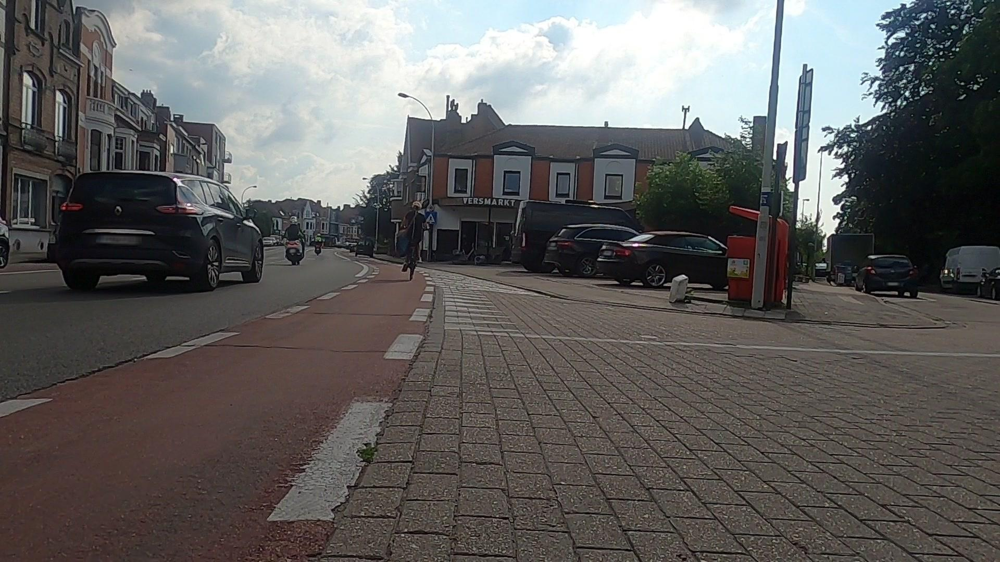

In [ ]:
image = test_ds[8]['pixel_values']
gt_seg = test_ds[8]['label']
image


To segment this test image, we first need to prepare the image using the image processor. Then we forward it through the model.

We also need to remember to upscale the output logits to the original image size. In order to get the actual category predictions, we just have to apply an `argmax` on the logits.

In [ ]:
from torch import nn

inputs = processor(images=image, return_tensors="pt")
outputs = model(**inputs)
logits = outputs.logits  # shape (batch_size, num_labels, height/4, width/4)

# First, rescale logits to original image size
upsampled_logits = nn.functional.interpolate(
    logits,
    size=image.size[::-1], # (height, width)
    mode='bilinear',
    align_corners=False
)

# Second, apply argmax on the class dimension
pred_seg = upsampled_logits.argmax(dim=1)[0]

Now it's time to display the result. The next cell defines the colors for each category, so that they match the "category coloring" on Segments.ai.

In [ ]:
#@title `def sidewalk_palette()`

def sidewalk_palette():
    """Sidewalk palette that maps each class to RGB values."""
    return [
        [0, 0, 0],
        [216, 82, 24],
        [255, 255, 0],
        [125, 46, 141],
        [118, 171, 47],
        [161, 19, 46],
        [255, 0, 0],
        [0, 128, 128],
        [190, 190, 0],
        [0, 255, 0],
        [0, 0, 255],
        [170, 0, 255],
        [84, 84, 0],
        [84, 170, 0],
        [84, 255, 0],
        [170, 84, 0],
        [170, 170, 0],
        [170, 255, 0],
        [255, 84, 0],
        [255, 170, 0],
        [255, 255, 0],
        [33, 138, 200],
        [0, 170, 127],
        [0, 255, 127],
        [84, 0, 127],
        [84, 84, 127],
        [84, 170, 127],
        [84, 255, 127],
        [170, 0, 127],
        [170, 84, 127],
        [170, 170, 127],
        [170, 255, 127],
        [255, 0, 127],
        [255, 84, 127],
        [255, 170, 127],
    ]

The next function overlays the output segmentation map on the original image.

In [ ]:
import numpy as np

def get_seg_overlay(image, seg):
  color_seg = np.zeros((seg.shape[0], seg.shape[1], 3), dtype=np.uint8) # height, width, 3
  palette = np.array(sidewalk_palette())
  for label, color in enumerate(palette):
      color_seg[seg == label, :] = color

  # Show image + mask
  img = np.array(image) * 0.5 + color_seg * 0.5
  img = img.astype(np.uint8)

  return img

We'll display the result next to the ground-truth mask.

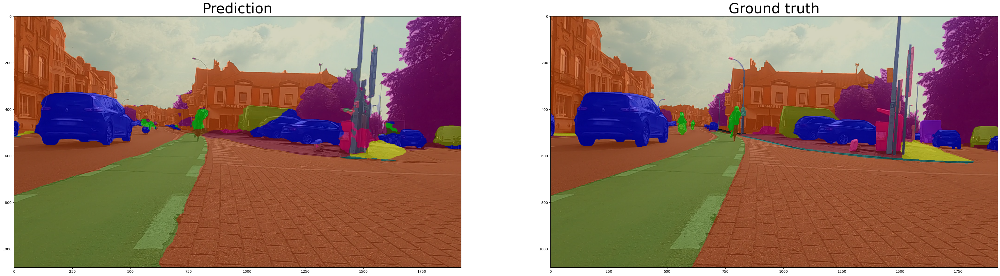

In [ ]:
import matplotlib.pyplot as plt

pred_img = get_seg_overlay(image, pred_seg)
gt_img = get_seg_overlay(image, np.array(gt_seg))

f, axs = plt.subplots(1, 2)
f.set_figheight(30)
f.set_figwidth(50)

axs[0].set_title("Prediction", {'fontsize': 40})
axs[0].imshow(pred_img)
axs[1].set_title("Ground truth", {'fontsize': 40})
axs[1].imshow(gt_img)


The result might not be perfect yet, but we can always expand our dataset to make the model more robust. We can now also go train a larger SegFormer model, and see how it stacks up.

# Conclusion

Semantic segmentation assigns a category to every pixel in an image typically using Convolutional Neural Networks, or CNNs. These networks use local window-like operations. They are efficient but lack a global understanding of the image.


Vision Transformer, on the other hand, uses self-attention a mechanism in deep learning that learns to attend to different parts of the input and represents their relationships. Self-attention enables more global understanding but it can be costly in both data and compute power.

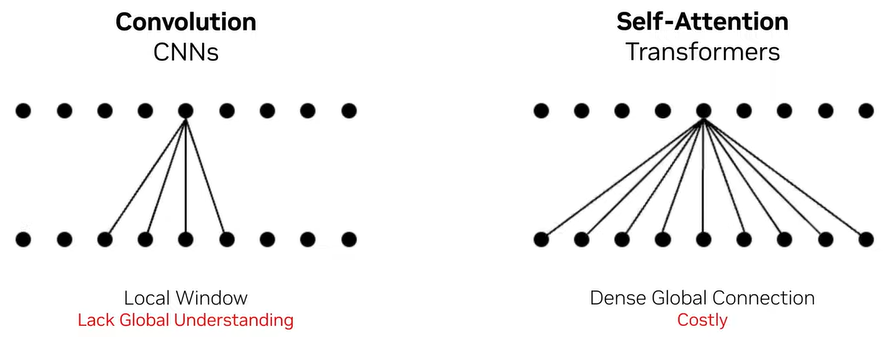

SegFormer introduces a new efficient self-attention design that achieves both global understanding and high efficiency The model splits an image into patches, producing multi-resolution features using efficient self-attention These features are then aggregated through a lightweight decoder to generate the segmentation predictions.

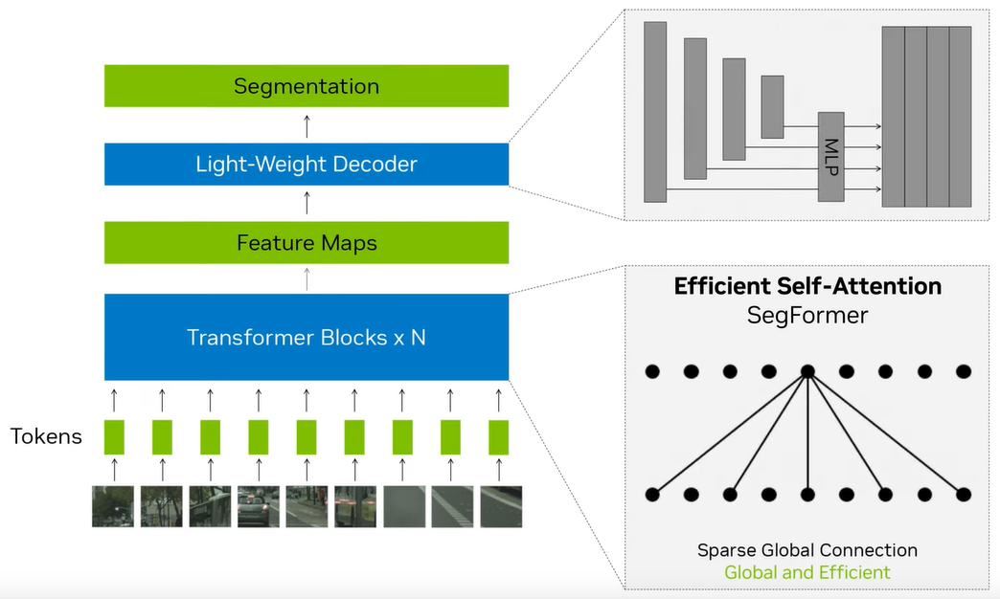

In [ ]:
from IPython.display import HTML

HTML('<iframe width="560" height="315" src="https://www.youtube.com/embed/J0MoRQzZe8U?si=kqbLc5tQ73EXfatr" title="YouTube video player" frameborder="0" allow="accelerometer; autoplay; clipboard-write; encrypted-media; gyroscope; picture-in-picture; web-share" allowfullscreen></iframe>')

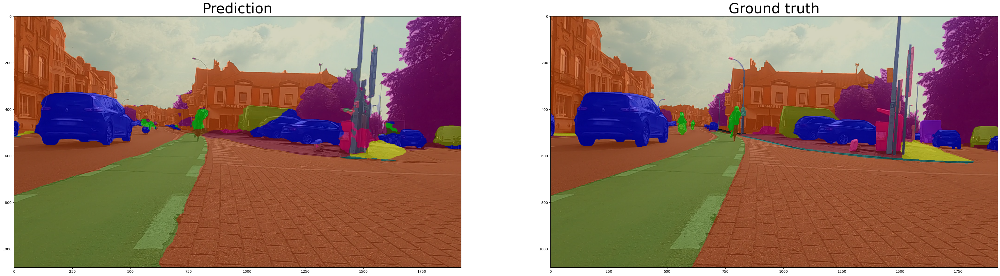

In [ ]:
import matplotlib.pyplot as plt
from torch import nn
import numpy as np


image = test_ds[8]['pixel_values']
gt_seg = test_ds[8]['label']
image


inputs = processor(images=image, return_tensors="pt")
outputs = model(**inputs)
logits = outputs.logits  # shape (batch_size, num_labels, height/4, width/4)

# First, rescale logits to original image size
upsampled_logits = nn.functional.interpolate(
    logits,
    size=image.size[::-1], # (height, width)
    mode='bilinear',
    align_corners=False
)

# Second, apply argmax on the class dimension
pred_seg = upsampled_logits.argmax(dim=1)[0]


def get_seg_overlay(image, seg):
  color_seg = np.zeros((seg.shape[0], seg.shape[1], 3), dtype=np.uint8) # height, width, 3
  palette = np.array(sidewalk_palette())
  for label, color in enumerate(palette):
      color_seg[seg == label, :] = color

  # Show image + mask
  img = np.array(image) * 0.5 + color_seg * 0.5
  img = img.astype(np.uint8)

  return img




pred_img = get_seg_overlay(image, pred_seg)
gt_img = get_seg_overlay(image, np.array(gt_seg))

f, axs = plt.subplots(1, 2)
f.set_figheight(30)
f.set_figwidth(50)

axs[0].set_title("Prediction", {'fontsize': 40})
axs[0].imshow(pred_img)
axs[1].set_title("Ground truth", {'fontsize': 40})
axs[1].imshow(gt_img)